# Introduction

The dataset for this competition (both train and test) was generated from a deep learning model trained on the Prediction of Mohs Hardness with Machine Learning Dataset. Feature distributions are close to, but not exactly the same, as the original.

# Importing Libraries and Loading Dataset.

In [1]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
import pandas as pd
import numpy as np
from ydata_profiling import ProfileReport
from matplotlib import pyplot as plt
import seaborn as sns
from scipy import stats
from statsmodels.stats.outliers_influence import variance_inflation_factor
from scipy.stats import zscore
import statsmodels.api as sm
from scipy.stats import skew
from scipy.stats import boxcox
from scipy.stats import yeojohnson
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor

In [2]:
train_df = pd.read_csv('train.csv')
test_df = pd.read_csv('test.csv')

In [3]:
print(train_df.shape)
print(test_df.shape)

(10407, 13)
(6939, 12)


In [4]:
train_df.head()

,id,allelectrons_Total,density_Total,allelectrons_Average,val_e_Average,atomicweight_Average,ionenergy_Average,el_neg_chi_Average,R_vdw_element_Average,R_cov_element_Average,zaratio_Average,density_Average,Hardness
0,0,100.0,0.841611,10.0,4.8,20.612526,11.08810,2.766,1.732,0.860,0.496070,0.91457,6.0
1,1,100.0,7.558488,10.0,4.8,20.298893,12.04083,2.755,1.631,0.910,0.492719,0.71760,6.5
2,2,76.0,8.885992,15.6,5.6,33.739258,12.08630,2.828,1.788,0.864,0.481478,1.50633,2.5
3,3,100.0,8.795296,10.0,4.8,20.213349,10.94850,2.648,1.626,0.936,0.489272,0.78937,6.0
4,4,116.0,9.577996,11.6,4.8,24.988133,11.82448,2.766,1.682,0.896,0.492736,1.86481,6.0


# EDA with pandas profiling

In [5]:
profile = ProfileReport(train_df) #pandas profiling help to do fast eda.
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

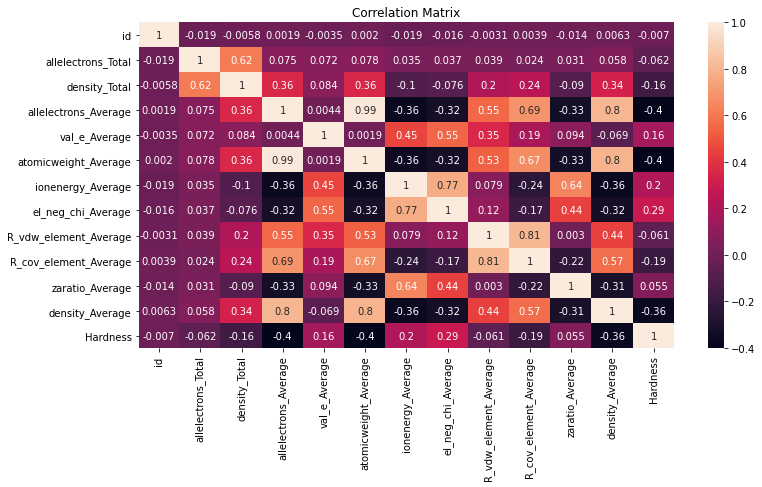

In [6]:
# correlation matrix
corr_matrix = train_df.corr(method = 'pearson', numeric_only = True)

plt.figure(figsize = (12, 6))
sns.heatmap(corr_matrix, annot = True)

plt.title("Correlation Matrix")
plt.show()

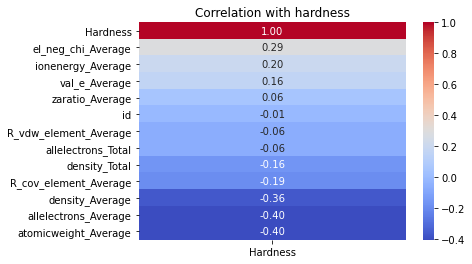

In [7]:
# checking correlation with target varaible 'Hardness'

corr = train_df.corr()
corr_hardness = corr["Hardness"].sort_values(ascending=False).to_frame()
sns.heatmap(corr_hardness, cmap="coolwarm", annot=True, fmt=".2f")
plt.title("Correlation with hardness")

plt.show()

In [8]:
# from corr matrix we can see high correlation among the independent variable,vif to cross check

independent_variables = train_df.drop('Hardness', axis=1)  # Exclude the target variable

# Calculate VIF for each independent variable
vif_data = pd.DataFrame()
vif_data["Variable"] = independent_variables.columns
vif_data["VIF"] = [variance_inflation_factor(independent_variables.values, i) for i in range(independent_variables.shape[1])]

print(vif_data)

                 Variable         VIF
0                      id    3.914181
1      allelectrons_Total    2.250237
2           density_Total    3.559023
3    allelectrons_Average  220.713442
4           val_e_Average   80.088444
5    atomicweight_Average  170.840403
6       ionenergy_Average  229.633509
7      el_neg_chi_Average  178.785522
8   R_vdw_element_Average  310.906958
9   R_cov_element_Average  131.065436
10        zaratio_Average  102.083054
11        density_Average    6.504822


In [9]:
# checking corr of 'atomicweight_Average' and 'allelectrons_Average' with other varibles

# Select the columns of interest for train data
selected_columns = ["atomicweight_Average", "allelectrons_Average"]

# Calculate correlation with all other columns
correlation_matrix = train_df.corrwith(train_df[selected_columns[0]]).to_frame("atomicweight_Average").join(
    train_df.corrwith(train_df[selected_columns[1]]).to_frame("allelectrons_Average")
)

print(correlation_matrix)

                       atomicweight_Average  allelectrons_Average
id                                 0.002035              0.001863
allelectrons_Total                 0.078489              0.074725
density_Total                      0.355614              0.356399
allelectrons_Average               0.990660              1.000000
val_e_Average                      0.001860              0.004376
atomicweight_Average               1.000000              0.990660
ionenergy_Average                 -0.356640             -0.360046
el_neg_chi_Average                -0.316053             -0.319413
R_vdw_element_Average              0.529277              0.550669
R_cov_element_Average              0.666165              0.688680
zaratio_Average                   -0.327459             -0.328973
density_Average                    0.796564              0.803641
Hardness                          -0.402948             -0.400496


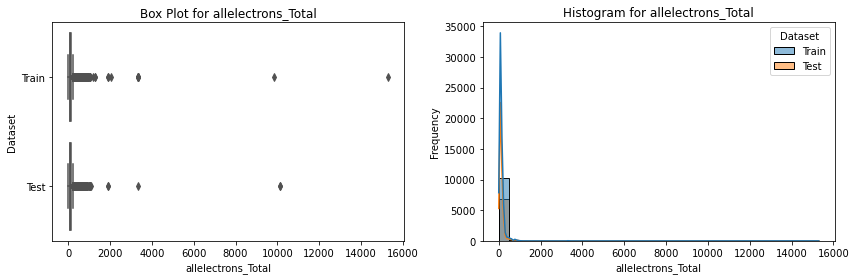

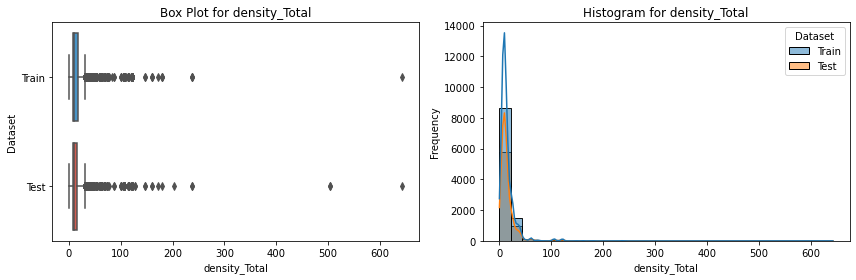

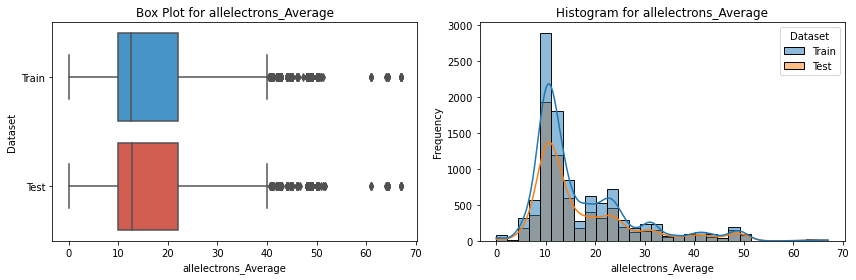

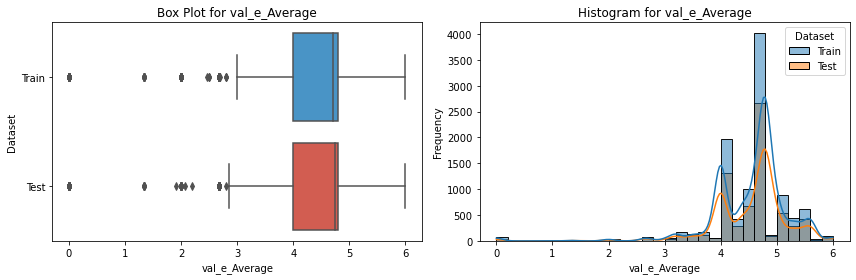

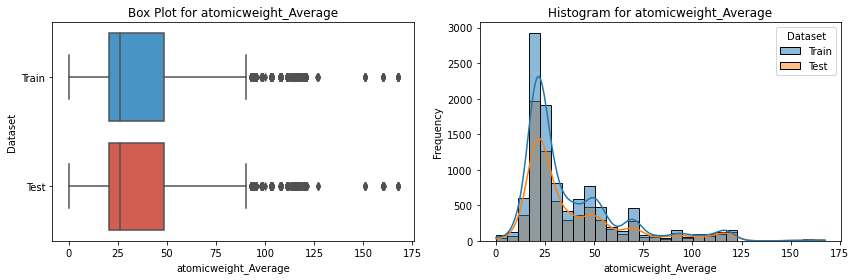

...

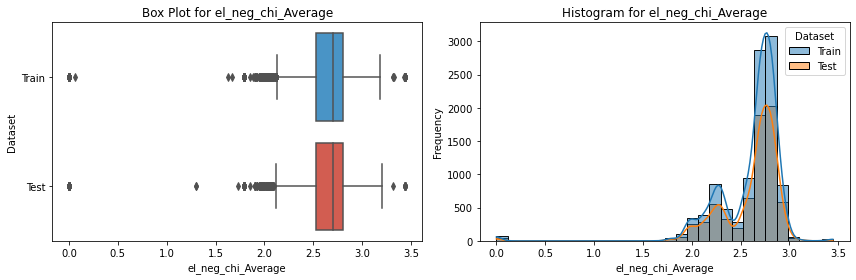

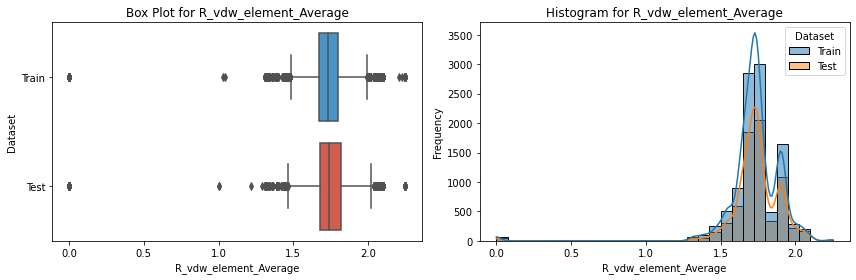

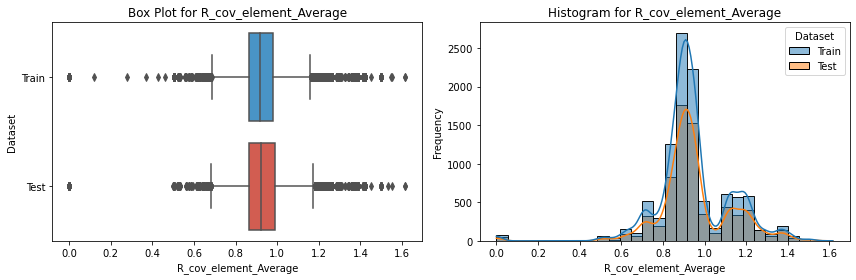

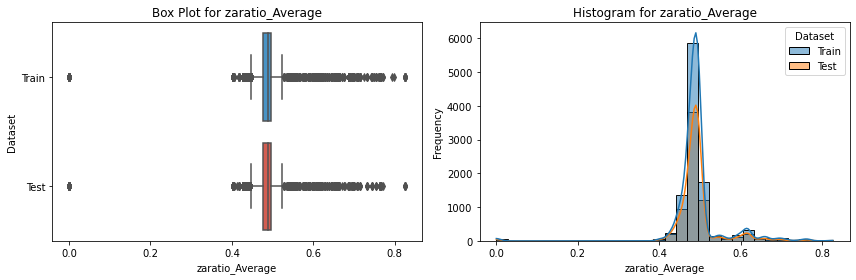

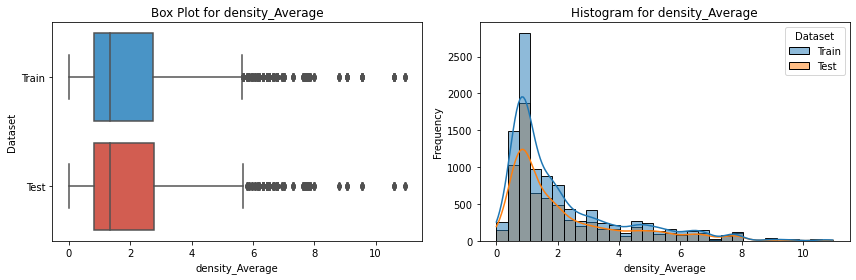

In [10]:
# checking the distribution of train and test data

custom_palette = ['#3498db', '#e74c3c']

variables = [col for col in train_df.columns if col not in ['id', 'Hardness']]

for variable in variables:
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))

    train_df['Dataset'] = 'Train'
    test_df['Dataset'] = 'Test'
    combined = pd.concat([train_df, test_df])

    sns.boxplot(data=combined, x=variable, y="Dataset", ax=axes[0], palette=custom_palette)
    sns.histplot(data=combined, x=variable, hue="Dataset", bins=30, kde=True, ax=axes[1])
    axes[0].set_xlabel(variable)
    axes[0].set_title(f"Box Plot for {variable}")
    axes[1].set_xlabel(variable)
    axes[1].set_ylabel("Frequency")
    axes[1].set_title(f"Histogram for {variable}")

    # Adjust spacing between subplots and show
    plt.tight_layout()
    plt.show()

train_df.drop('Dataset', axis=1, inplace=True)
test_df.drop('Dataset', axis=1, inplace=True)

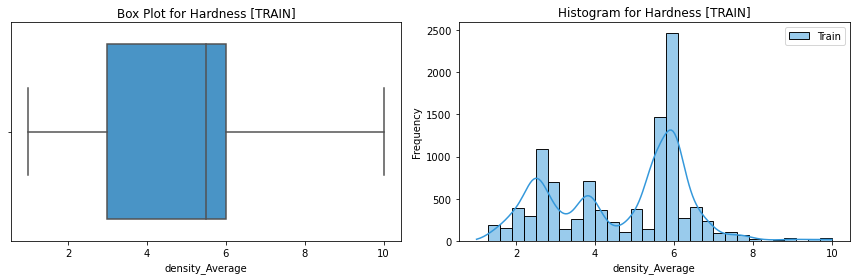

In [11]:
# Analysis of TARGET feature

fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# Box plot
plt.subplot(1, 2, 1)
sns.boxplot(data=train_df, x='Hardness', palette=custom_palette)
plt.xlabel(variable)
plt.title(f"Box Plot for Hardness [TRAIN]")

# Separate Histograms
plt.subplot(1, 2, 2)
sns.histplot(data=train_df, x='Hardness', color=custom_palette[0], kde=True, bins=30, label="Train")
plt.xlabel(variable)
plt.ylabel("Frequency")
plt.title(f"Histogram for Hardness [TRAIN]")
plt.legend()

# Adjust spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()

# Findings From EDA

In [12]:
# All the features are numeric.

# there is no missing value.

#  outlier's presence across all columns in the data.

# data have both left and right skewness

# "atomicweight_Average" and "allelectrons_Average" is 0.99 (almost identical)

# "allelectrons_Total" is highly skewed (γ1 = 33.39115372).

# there is high correlations among the independent variables.

# vif > 10 Indicates a high level of multicollinearity, apart from 3 variables  "allelectrons_Total", "density_Total" and "density_Average" all other have high correlations.

# Train and Test data have similar distributions

# All variables have a low correlation with the target variable "Hardness".

# Preprocessing

In [49]:
# removing 'allelectrons_Average' because it is highly correlated with "atomicweight_Average"(0.99).

train_df.drop(columns=['id', 'allelectrons_Average'], inplace=True)

In [14]:
# removing outliers using z_score from train and test data

def remove_outliers(df, threshold=3):
    z_scores = zscore(df)

    outliers = (abs(z_scores) > threshold).any(axis=1)

    # Remove the outliers
    df_no_outliers = df[~outliers]

    return df_no_outliers

train_df = remove_outliers(train_df) # removes outlirers from train data
print(train_df.shape)

(9549, 11)


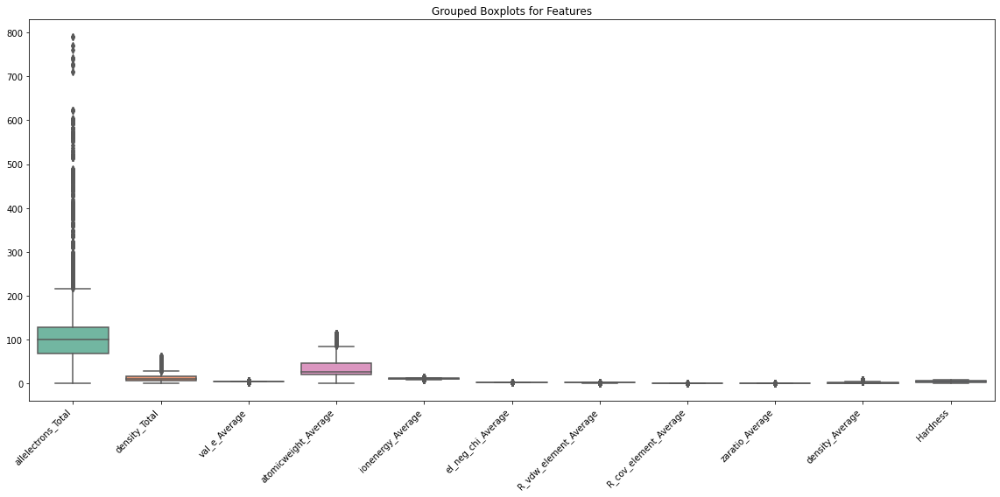

In [15]:
# checking if the ouliers removed or not
plt.figure(figsize=(16, 8))
sns.boxplot(data=train_df, palette='Set2')
# Adjust layout
plt.title('Grouped Boxplots for Features')
plt.xticks(rotation=45, ha='right')  
plt.tight_layout()
plt.show()

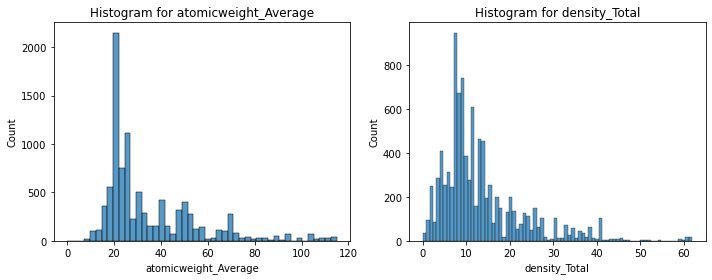

In [16]:
# Set the figure size
plt.figure(figsize=(10, 4))

# Create subplots
plt.subplot(1, 2, 1)
sns.histplot(data=train_df['atomicweight_Average'])
plt.title('Histogram for atomicweight_Average')

plt.subplot(1, 2, 2)
sns.histplot(data=train_df['density_Total'])
plt.title('Histogram for density_Total')

plt.tight_layout()

plt.show()

#### atomicweight_Average and density_Total still have outliers because they are highly skewed.

### handling Skewness.

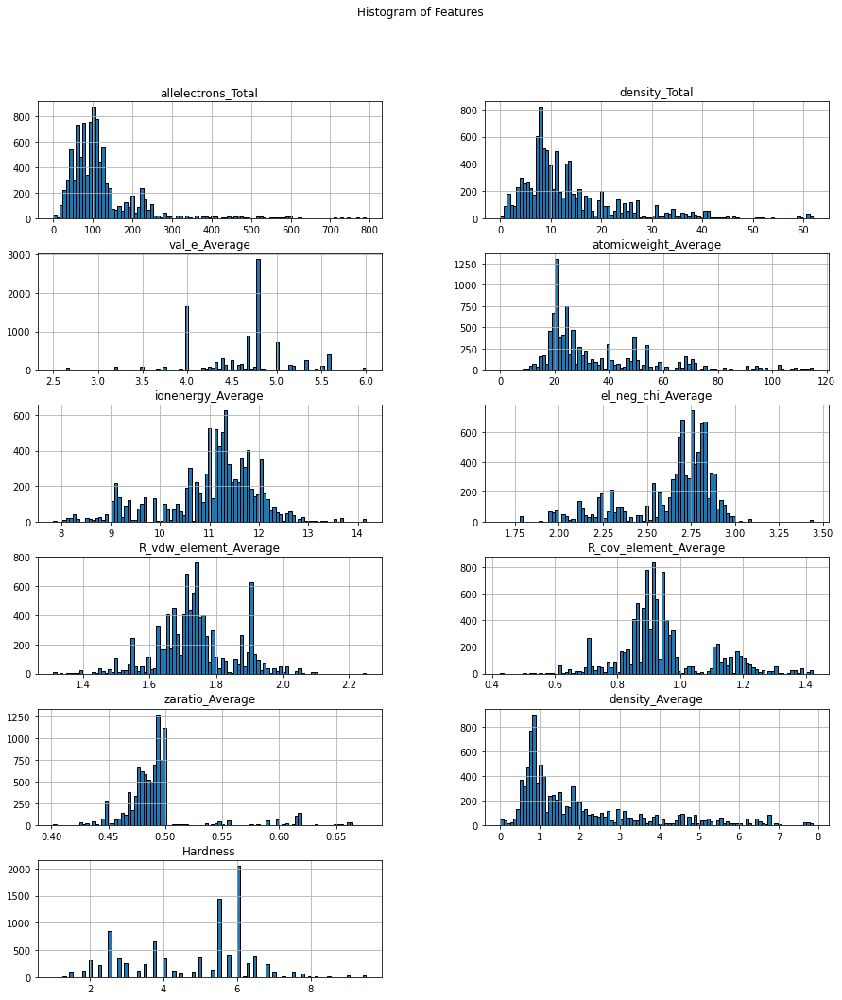

In [17]:
# data distribution and skewness check after removing outliers, skewness has been reduced little bit after removing outliers.
num_bins = int(np.sqrt(len(train_df)))

train_df.hist(bins=num_bins, figsize=(15, 20), edgecolor="black", layout=(7, 2))
plt.suptitle("Histogram of Features", x=0.5, y=0.95, ha="center", fontsize="large")
plt.style.use("ggplot")
plt.show()

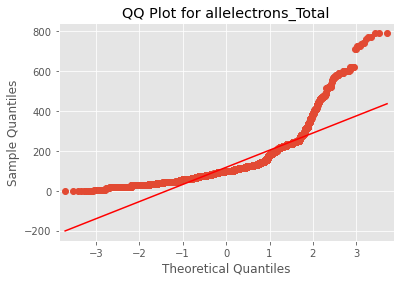

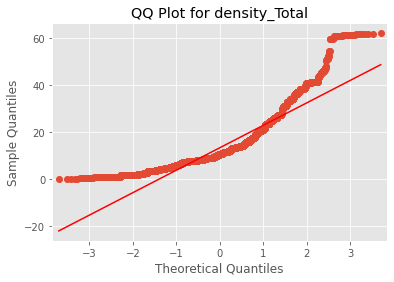

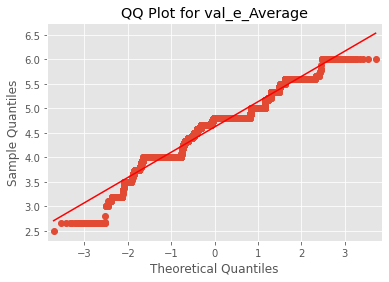

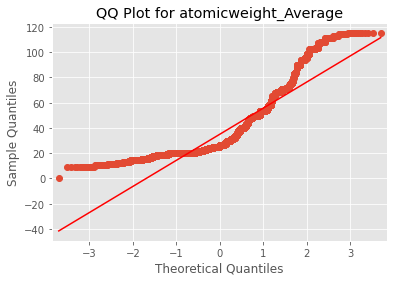

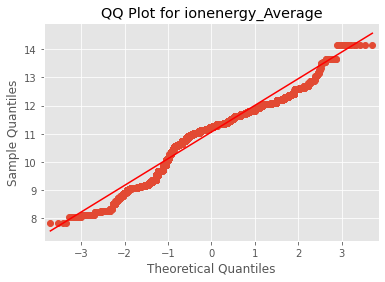

...

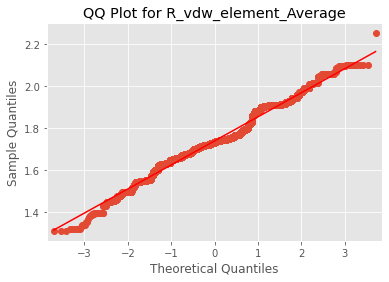

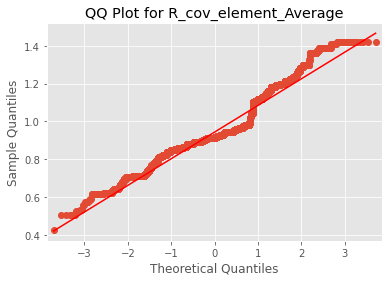

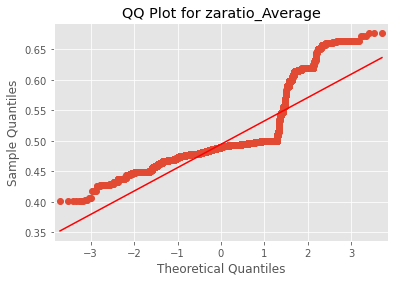

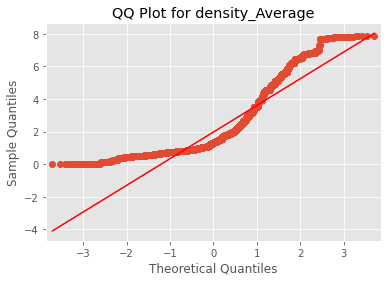

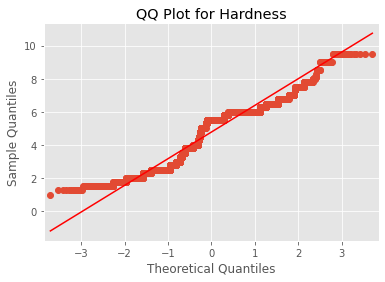

In [18]:
# checking for skewness using qq plot.

def plot_qq_plots(train_df):
    columns = train_df.select_dtypes(include='number').columns

    for column in columns:
        sm.qqplot(train_df[column], line='s')
        plt.title(f'QQ Plot for {column}')
        plt.show()


plot_qq_plots(train_df)

In [19]:
def apply_boxcox_transform(df, skew_threshold=0.5):

    # Calculate skewness values
    skewness_values = df.skew()

    # Identify skewed features
    skewed_features = skewness_values[abs(skewness_values) > skew_threshold].index

    # Apply Box-Cox transformation to skewed features
    for feature in skewed_features:
        # Add 1 to handle non-positive values
        df[feature] = boxcox(df[feature] + 0.0001)[0]

    return df

train_df = apply_boxcox_transform(train_df)

<ipython-input-19-54a5ad8f571c>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[feature] = boxcox(df[feature] + 0.0001)[0]


allelectrons_Total       0.124555
density_Total            0.056525
val_e_Average           -0.426346
atomicweight_Average     0.043379
ionenergy_Average        0.059741
el_neg_chi_Average       0.053291
R_vdw_element_Average    0.110322
R_cov_element_Average   -0.014754
zaratio_Average         -0.345206
density_Average          0.156502
Hardness                -0.310440
dtype: float64


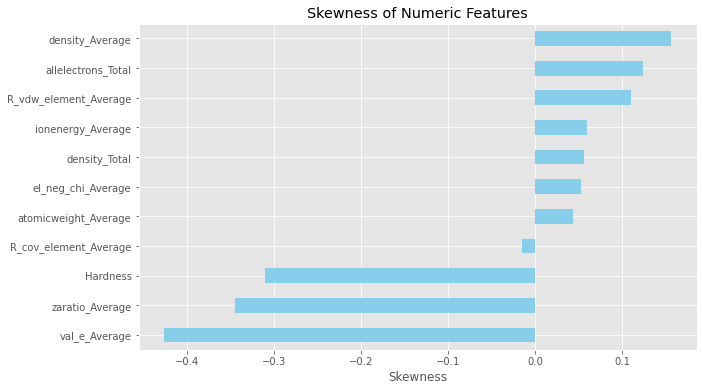

In [20]:
skewness_values = train_df.skew()
print(skewness_values) 
plt.figure(figsize=(10, 6))
skewness_values.sort_values().plot(kind='barh', color='skyblue')
plt.title('Skewness of Numeric Features')
plt.xlabel('Skewness')
plt.show()

# Train_test split and ML pipeline

In [21]:
y = train_df['Hardness']
x = train_df.drop('Hardness', axis=1)

# Split the data into training and testing sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

In [22]:
pipelines = {
    'rf': Pipeline([
        ('scaler', StandardScaler()),  # Feature scaling
        ('pca', PCA(n_components=5)),  # Principal Component Analysis
        ('rf', RandomForestRegressor())
    ]),
    'lgbm': Pipeline([
          ('scaler', StandardScaler()),  
          ('pca', PCA(n_components=5)),  
          ('lgbm', LGBMRegressor())
    ]),
    'xgb': Pipeline([
         ('scaler', StandardScaler()),  
         ('pca', PCA(n_components=5)),  
         ('xgb', XGBRegressor())
    ])
}

In [23]:
# Define hyperparameter grids
param_grids = {
    'rf': {
        'rf__n_estimators': [100, 200, 300],
        'rf__max_depth': [5, 10, 20],
        'rf__min_samples_split': [5,10]

    },
    'lgbm':{
        'lgbm__n_estimators': [100,200,300],
        'lgbm__max_depth': [5, 10, 15],
        'lgbm__num_leaves': [20, 30, 50],
        'lgbm__learning_rate': [0.05,0.1]
    },
    'xgb':{
        'xgb__n_estimators': [100, 200, 500],
        'xgb__max_depth': [5, 10, 15],
        'xgb__learning_rate': [0.01, 0.1],
        'xgb__min_child_samples': [5, 10, 20]
    }
}

In [24]:
# Create a blank dictionary to hold the models
fit_models = {}

# Loop through all the algos
for algo, pipe in pipelines.items():
    print(f'Training the {algo} model.')

    # Create Grid Search CV class with the specified hyperparameter grid
    model = GridSearchCV(pipe, param_grids[algo], n_jobs=-1, cv=5)

    # Train the model
    model.fit(x_train, y_train)

    # Store results inside the dictionary
    fit_models[algo] = model

Training the rf model.
Training the lgbm model.
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000727 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 7639, number of used features: 5
[LightGBM] [Info] Start training from score 4.798500
Training the xgb model.
[16:06:57] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-03de431ba26204c4d-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "min_child_samples" } are not used.



In [25]:
 # Evaluate the performance of the model
for algo, model in fit_models.items():
    yhat = model.predict(x_test)
    mse = mean_squared_error(y_test, yhat)
    mae = mean_absolute_error(y_test, yhat)
    r2 = r2_score(y_test, yhat)
    print(f'Metrics for {algo}: mse- {mse}, mae- {mae}, r2- {r2}')

Metrics for rf: mse- 1.6957737165964828, mae- 0.988022118184659, r2- 0.35164589413182656
Metrics for lgbm: mse- 1.701409519835129, mae- 1.005076824265809, r2- 0.34949112776537095
Metrics for xgb: mse- 1.70155056948758, mae- 1.0062290853480393, r2- 0.3494371995080787


In [28]:
# Display the best parameters for each model
for algo, model in fit_models.items():
    print(f'Best parameters for {algo}: {model.best_params_}')

Best parameters for rf: {'rf__max_depth': 10, 'rf__min_samples_split': 5, 'rf__n_estimators': 300}
Best parameters for lgbm: {'lgbm__learning_rate': 0.05, 'lgbm__max_depth': 15, 'lgbm__n_estimators': 100, 'lgbm__num_leaves': 20}
Best parameters for xgb: {'xgb__learning_rate': 0.01, 'xgb__max_depth': 5, 'xgb__min_child_samples': 5, 'xgb__n_estimators': 500}


# Save the best model

In [32]:
import pickle

with open('randomforest.pkl', 'wb') as f:
  pickle.dump(fit_models['rf'], f)

In [33]:
with open('randomforest.pkl', 'rb') as f:
  reloaded_model = pickle.load(f)


# Preprocessing test data

In [58]:
test_df = pd.read_csv('test.csv')
print(test_df.shape)

(6939, 12)


In [59]:
# Deep copy
abt_test = test_df.copy()

In [60]:
abt_test.drop(columns=['id', 'allelectrons_Average'], inplace=True)

In [70]:
test_df = remove_outliers(test_df)   # removes outlirers from test data
print(test_df.shape)

(6161, 12)


In [62]:
test_df = apply_boxcox_transform(test_df) # applying box-cox transformation

In [63]:
a = test_df.skew()
print(a)

id                      -0.007198
allelectrons_Total       0.125247
density_Total            0.042412
allelectrons_Average     0.074974
val_e_Average           -0.438345
atomicweight_Average    -0.043009
ionenergy_Average        0.069580
el_neg_chi_Average      -0.105952
R_vdw_element_Average    0.281870
R_cov_element_Average   -0.015397
zaratio_Average         -0.294999
density_Average          0.153524
dtype: float64


In [64]:
# fit best model i.e. Random Forest on test data

yhat_test = fit_models['rf'].predict(abt_test)

In [65]:
submission = pd.DataFrame([test_df['id'], yhat_test]).T
submission.columns = ['id', 'Hardness']

In [69]:
submission.head()

,id,Hardness
1,10408.0,3.778611
2,10409.0,3.788111
3,10410.0,3.788111
4,10411.0,3.778611
5,10412.0,3.788111
